In [1]:
# basic tools
import numpy as np
import matplotlib.image as img
import matplotlib.pyplot as plt
%matplotlib inline
import cv2

# utils
import os
import random
from collections import defaultdict
import collections
from shutil import copy
from shutil import copytree, rmtree

# tensorflow, keras imports
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import models
import tensorflow.keras.backend as K
from tensorflow.keras.models import load_model, Model, Sequential
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import regularizers
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.regularizers import l2



In [2]:
# download data and extract

print("Downloading the data...")
!wget http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz

print("Dataset downloaded!")
print("Extracting data..")

!tar xzvf food-101.tar.gz
print("Extraction done!")

Streaming output truncated to the last 5000 lines.
food-101/images/cannoli/3201965.jpg
food-101/images/cannoli/3778102.jpg
food-101/images/cannoli/2674065.jpg
food-101/images/cannoli/1169899.jpg
food-101/images/cannoli/1378086.jpg
food-101/images/cannoli/803909.jpg
food-101/images/cannoli/1067240.jpg
food-101/images/cannoli/3002709.jpg
food-101/images/cannoli/2612632.jpg
food-101/images/cannoli/3627612.jpg
food-101/images/cannoli/1798703.jpg
food-101/images/cannoli/560632.jpg
food-101/images/cannoli/512468.jpg
food-101/images/cannoli/2331523.jpg
food-101/images/cannoli/3118302.jpg
food-101/images/cannoli/1499412.jpg
food-101/images/cannoli/1557459.jpg
food-101/images/cannoli/146566.jpg
food-101/images/cannoli/96922.jpg
food-101/images/cannoli/1699562.jpg
food-101/images/cannoli/730051.jpg
food-101/images/cannoli/2177977.jpg
food-101/images/cannoli/2767028.jpg
food-101/images/cannoli/6564.jpg
food-101/images/cannoli/553447.jpg
food-101/images/cannoli/3452001.jpg
food-101/images/cannoli/

In [3]:
# each folder represents a class of food
os.listdir('food-101/images')

['cup_cakes',
 'garlic_bread',
 'escargots',
 'sashimi',
 'steak',
 'grilled_salmon',
 'edamame',
 'caprese_salad',
 'omelette',
 'gnocchi',
 'foie_gras',
 'ramen',
 'fish_and_chips',
 'hummus',
 'deviled_eggs',
 'pizza',
 'beignets',
 'eggs_benedict',
 'spaghetti_bolognese',
 'fried_calamari',
 'oysters',
 'greek_salad',
 'beef_tartare',
 'samosa',
 'tiramisu',
 'chicken_curry',
 'baklava',
 'lasagna',
 'french_toast',
 'huevos_rancheros',
 'ceviche',
 'tuna_tartare',
 'spaghetti_carbonara',
 'prime_rib',
 'cannoli',
 'apple_pie',
 'panna_cotta',
 'hamburger',
 'hot_and_sour_soup',
 'baby_back_ribs',
 'french_fries',
 'peking_duck',
 'hot_dog',
 'chocolate_mousse',
 'scallops',
 'red_velvet_cake',
 'frozen_yogurt',
 'donuts',
 'takoyaki',
 'dumplings',
 'caesar_salad',
 'cheese_plate',
 'gyoza',
 'pho',
 'shrimp_and_grits',
 'ice_cream',
 'bruschetta',
 'waffles',
 'creme_brulee',
 'crab_cakes',
 'strawberry_shortcake',
 'lobster_bisque',
 'french_onion_soup',
 'grilled_cheese_sandwic

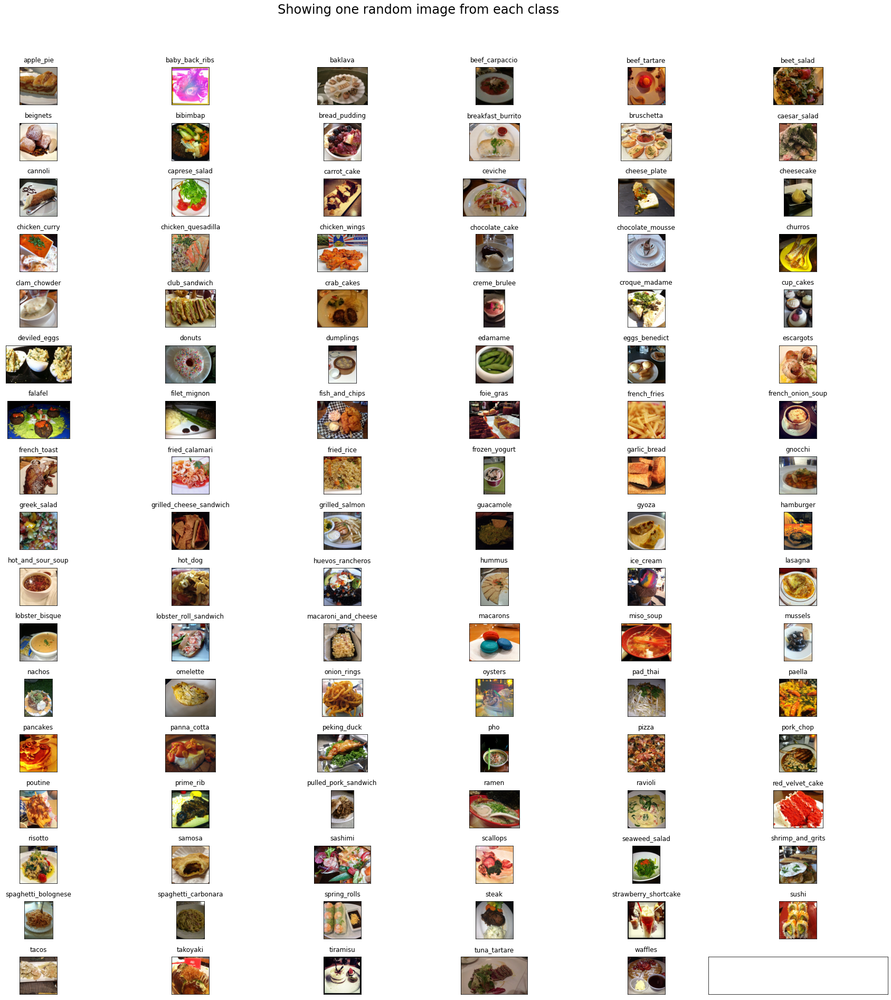

In [4]:
# Show one image per class and plot them

rows = 17
cols = 6

fig, ax = plt.subplots(rows, cols, figsize=(25,25))
fig.suptitle("Showing one random image from each class", y=1.05, fontsize=24) # Adding  y=1.05, fontsize=24 helped me fix the suptitle overlapping with axes issue

main_dir = "food-101/images/"

foods_sorted = sorted(os.listdir(main_dir))
food_id = 0

for i in range(rows):
  for j in range(cols):
    try:
      chosen_food = foods_sorted[food_id] 
      food_id += 1
    except:
      break
      
    if chosen_food == '.DS_Store':
        continue
    chosen_food_images = os.listdir(os.path.join(main_dir,chosen_food)) # returns the list of all files present in each food category
    chosen_food_random = np.random.choice(chosen_food_images) # picks one food item from the list as choice, takes a list and returns one random item
    
    img = plt.imread(os.path.join(main_dir,chosen_food, chosen_food_random))
    
    ax[i][j].imshow(img)
    ax[i][j].set_title(chosen_food, pad = 10)
    
plt.setp(ax, xticks=[],yticks=[])
plt.tight_layout()


In [5]:
# Split dataset into train and test folders
def prepare_data(file_path, src, dest):
    classes = defaultdict(list)
    
    with open(file_path, 'r') as txt:
        paths = [read.strip() for read in txt.readlines()]
        
        for p in paths:
            food = p.split('/')
            classes[food[0]].append(food[1] + '.jpg')
    
    print("Copying images...\n")
    for food in classes.keys():
        #print("\nCopying images into ",food)
        
        if not os.path.exists(os.path.join(dest,food)):
            os.makedirs(os.path.join(dest,food))
        
        for i in classes[food]:
            copy(os.path.join(src,food,i), os.path.join(dest,food,i))
    
    print("Copied!")

In [7]:
# For Train dataset: copy images from food-101/images to food-101/train using the file train.txt
print("Creating train data...")
prepare_data('food-101/meta/train.txt', 'food-101/images', 'train')

# check number of samples in train folder
print("Total number of samples in train folder:")
!find train -type d -or -type f -printf '.' | wc -c

Creating train data...
Copying images...

Copied!
Total number of samples in train folder:
75750


In [8]:
# For test data: copy images from food-101/images to food-101/test using the file test.txt
print("Creating test data...")
prepare_data('food-101/meta/test.txt', 'food-101/images', 'test')

# Check how many files are in the test folder
print("Total number of samples in test folder")
!find test -type d -or -type f -printf '.' | wc -c

Creating test data...
Copying images...

Copied!
Total number of samples in test folder
25250


In [ ]:
print(foods_sorted[0])
len(foods_sorted)

In [ ]:
foods_sorted = [
 'apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster_roll_sandwich',
 'macaroni_and_cheese',
 'macarons',
 'miso_soup',
 'mussels',
 'nachos',
 'omelette',
 'onion_rings',
 'oysters',
 'pad_thai',
 'paella',
 'pancakes',
 'panna_cotta',
 'peking_duck',
 'pho',
 'pizza',
 'pork_chop',
 'poutine',
 'prime_rib',
 'pulled_pork_sandwich',
 'ramen',
 'ravioli',
 'red_velvet_cake',
 'risotto',
 'samosa',
 'sashimi',
 'scallops',
 'seaweed_salad',
 'shrimp_and_grits',
 'spaghetti_bolognese',
 'spaghetti_carbonara',
 'spring_rolls',
 'steak',
 'strawberry_shortcake',
 'sushi',
 'tacos',
 'takoyaki',
 'tiramisu',
 'tuna_tartare',
 'waffles']

foods_sorted

In [ ]:
# '''
#     - For now, we will take only a subset of classes for this submission.
#     - So, we will create a small dataset to work on.
# '''

# def prepare_subset_dataset(food_list, src, dest):
#     if os.path.exists(dest):
#         # removing subset_dataset folder (if it already exists) folders so that we will have only the classes that we want
#         rmtree(dest)
#         os.makedirs(dest)
    
#     for item in food_list :
#         print("Copying images into", item)
#         copytree(os.path.join(src, item), os.path.join(dest, item))
        

In [ ]:
# # picking 3 food items and generating separate data folders for the same
# food_list = ['pizza', 'chicken_wings', 'pancakes']
# src_train = 'train'
# dest_train = 'train_subset'
# src_test = 'test'
# dest_test = 'test_subset'

In [ ]:
# %%script false --no-raise-error
# # prepare subset dataset to work on for this submission
# print("Creating train data folder with new classes")
# prepare_subset_dataset(food_list, src_train, dest_train)

# print("Total number of samples in train folder")
# !find train_subset -type d -or -type f -printf '.' | wc -c

# print("Creating test data folder with new classes")
# prepare_subset_dataset(food_list, src_test, dest_test)

# print("Total number of samples in test folder")
# !find test_subset -type d -or -type f -printf '.' | wc -c

In [ ]:
# # Building Model & Training

# K.clear_session()

# n_classes = 101
# img_width, img_height = 299, 299

# train_data_dir = 'train'
# validation_data_dir = 'test'

# nb_train_samples = 75750 # Train images count in 3 classes for now
# nb_validation_samples = 25250 #
# batch_size = 32

# train_datagen = ImageDataGenerator(
#     rescale=1. / 255,
#     shear_range=0.2,
#     zoom_range=0.2,
#     horizontal_flip=True)

# test_datagen = ImageDataGenerator(rescale=1. / 255)

# inception = InceptionV3(weights='imagenet', include_top=False)
# x = inception.output
# x = GlobalAveragePooling2D()(x)
# x = Dense(128,activation='relu')(x)
# x = Dropout(0.2)(x)

# predictions = Dense(101,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

# model = Model(inputs=inception.input, outputs=predictions)

# model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
# checkpointer = ModelCheckpoint(filepath='best_model.hdf5', verbose=1, save_best_only=True)
# csv_logger = CSVLogger('history.log')

# train_generator = train_datagen.flow_from_directory(
#     train_data_dir,
#     target_size=(img_height, img_width),
#     batch_size=batch_size,
#     class_mode='categorical')

# validation_generator = test_datagen.flow_from_directory(
#     validation_data_dir,
#     target_size=(img_height, img_width),
#     batch_size=batch_size,
#     class_mode='categorical')

# history = model.fit_generator(train_generator,
#                     steps_per_epoch = nb_train_samples // batch_size,
#                     validation_data=validation_generator,
#                     validation_steps=nb_validation_samples // batch_size,
#                     epochs=10,
#                     verbose=1,
#                     callbacks=[csv_logger, checkpointer])

# model.save('model_trained.hdf5')

In [ ]:
# class_map = train_generator.class_indices
# class_map

In [ ]:
# # Helper classes to plot accuracy and loss data

# def plot_accuracy(history, title):
#     plt.title(title)
#     plt.plot(history.history['accuracy'])
#     plt.plot(history.history['val_accuracy'])
#     plt.ylabel('accuracy')
#     plt.xlabel('epoch')
#     plt.legend(['train_accuracy', 'validation_accuracy'], loc='best')
#     plt.show()

# def plot_loss(history, title):
#     plt.title(title)
#     plt.plot(history.history['loss'])
#     plt.plot(history.history['val_loss'])
#     plt.ylabel('loss')
#     plt.xlabel('epoch')
#     plt.legend(['train_loss', 'validation_loss'], loc='best')
#     plt.show()

In [ ]:
# history

In [ ]:
# plot_accuracy(history,'FOOD 101 - Subset of classes classifier with Inceptionv3')

# plot_loss(history,'FOOD 101 - Subset of classes classifier with Inceptionv3')

In [10]:
%%time
# Loading the best saved model to make predictions
#K.clear_session()
model_best = load_model('/content/best_model.hdf5',compile = False)

CPU times: user 2.93 s, sys: 442 ms, total: 3.37 s
Wall time: 10.7 s


In [46]:
def predict_class(model, images, show = True):
  for img in images:
    img = image.load_img(img, target_size=(299, 299))
    img = image.img_to_array(img)                    
    img = np.expand_dims(img, axis=0)         
    img /= 255.                                      

    pred = model.predict(img)
    index = np.argmax(pred)
    foods_sorted.sort()
    pred_value = foods_sorted[index]
    
    if show:
        plt.imshow(img[0])                           
        plt.axis('off')
        plt.title(pred_value)
        plt.show()

In [ ]:
# Testing with images from internet
!wget -O pizza.jpg https://upload.wikimedia.org/wikipedia/commons/a/a3/Eq_it-na_pizza-margherita_sep2005_sml.jpg
!wget -O pancake.jpg https://images.immediate.co.uk/production/volatile/sites/30/2020/08/perfect-pancakes-ad7a753.jpg
!wget -O chicken-wings.jpg https://www.munatycooking.com/wp-content/uploads/2016/05/crispy-spicy-chicken-wings-small-feature-image-500x375.jpg



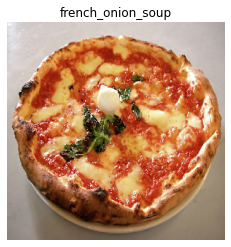

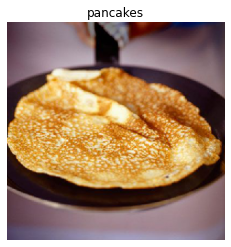

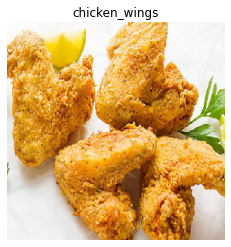

In [13]:
# Make a list of downloaded images and test the trained model
images = []
images.append('pizza.jpg')
images.append('pancake.jpg')
images.append('chicken-wings.jpg')

predict_class(model_best, images, True)

In [14]:
!pip install git+https://github.com/nficano/pytube.git
from pytube import YouTube

  Cloning https://github.com/nficano/pytube.git to /tmp/pip-req-build-qmxifm_u
  Running command git clone -q https://github.com/nficano/pytube.git /tmp/pip-req-build-qmxifm_u
  Created wheel for pytube3: filename=pytube3-9.6.4-cp36-none-any.whl size=38856 sha256=92d90ab5551ee75f2596d6859605192d7315144ebc906cf33ee5351a86b88a7f
  Stored in directory: /tmp/pip-ephem-wheel-cache-syioalv2/wheels/5b/8a/06/0917964e90543f272c8e17cd550f7b5748b19a795c24289ec2
Successfully built pytube3


In [15]:
video_url = "https://www.youtube.com/watch?v=nqLvZT4d0iA"
video_name = ""

yt = YouTube(video_url)
stream = yt.streams.filter(adaptive=True, type="video", res="240p", file_extension="mp4")[0]
stream

<Stream: itag="133" mime_type="video/mp4" res="240p" fps="30fps" vcodec="avc1.4d400c" progressive="False" type="video">

In [16]:
yt.streams.first().download("")

'/content/Types of foods in English  List Names of Foods  Food Vocabulary.mp4'

In [17]:
from IPython.display import HTML
from base64 import b64encode

In [19]:
mp4 = open("Types of foods in English  List Names of Foods  Food Vocabulary.mp4", "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

In [20]:
HTML("""
    <video width=400 controls>
        <source src="%s" type="video/mp4">
    </video>
""" % data_url)

In [21]:
VIDEO_STREAM = "Types of foods in English  List Names of Foods  Food Vocabulary.mp4"
VIDEO_STREAM_OUT = "result.mp4"

In [ ]:
# # Initialize the video stream and pointer to output video file
# vs = cv2.VideoCapture(VIDEO_STREAM)
# writer = None
# vs.set(cv2.CAP_PROP_POS_FRAMES, 1000);

# i = 0
# while i < 20000:
#   # read the next frame from the file
#   (grabbed, frame) = vs.read()
#   i += 1
   
#   # If the frame was not grabbed, then we have reached the end
#   # of the stream
#   if not grabbed:
#     print ("Not grabbed.")
#     break;

#   plt.imshow(frame)
#   # Run detection
#   results = predict_class(model_best, frame, True)
  
#   # Visualize results
#   r = results[0]
#   masked_frame = display_instances(frame, r['rois'], r['masks'], r['class_ids'],
#                             class_names, r['scores'])
    
#   # Check if the video writer is None
#   if writer is None:
#     # Initialize our video writer
#     fourcc = cv2.VideoWriter_fourcc(*"XVID")
#     writer = cv2.VideoWriter(VIDEO_STREAM_OUT, fourcc, 30,
#       (masked_frame.shape[1], masked_frame.shape[0]), True)
   
#   # Write the output frame to disk
#   writer.write(masked_frame)
    
# # Release the file pointers
# print("[INFO] cleaning up...")
# writer.release()


In [ ]:
# import cv2

# input_video = "Types of foods in English  List Names of Foods  Food Vocabulary.mp4"

# nms_th = 0.5
# threshold = 0.6

# flux = cv2.VideoCapture(input_video) # Capture input_video

# fps = flux.get(cv2.CAP_PROP_FPS)
# frame_count = int(flux.get(cv2.CAP_PROP_FRAME_COUNT))
# duration = frame_count/fps
# print("Duration of the video:", duration, "seconds")

# fourcc = cv2.VideoWriter_fourcc(*'XVID')# FourCC is a 4-byte code used to specify the video codec. The list of available codes can be found in fourcc.org

# frame_width = int(flux.get(3))
# frame_height = int(flux.get(4))

# out = cv2.VideoWriter('output.avi',fourcc, flux.get(cv2.CAP_PROP_FPS), (frame_width,frame_height)) # We should specify the output file name, the FourCC code, number of frames per second (fps) and frame size


# while True:
  
#   ret_val, img = flux.read()
  
#   if not ret_val:
#     break

#   image, image_data = preprocess_image_cv2(img, model_image_size = (299, 299))
#   height_image, width_image, channel = image.shape

#   prediction = model_best.predict(image_data)
#   print('prediction: ', prediction)
#   plt.imshow(image)
#   plt.show()
#   #image = post_process_yolo(yolo_outputs)

#   img = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
  
#   out.write(img)

# print("Prediction finished. Results stores in output.avi")

In [ ]:
# fps = flux.get(cv2.CAP_PROP_FPS)
# frame_count = int(flux.get(cv2.CAP_PROP_FRAME_COUNT))
# duration = frame_count/fps

# fps, frame_count, duration

In [22]:
def preprocess_image_cv2(img, model_image_size):
    resized_image = cv2.resize(img, model_image_size)
    resized_image = resized_image / 255.
    resized_image = np.expand_dims(resized_image, 0)  # Add batch dimension.
    return img, resized_image


  0%|          | 0/1 [00:00<?, ?it/s]

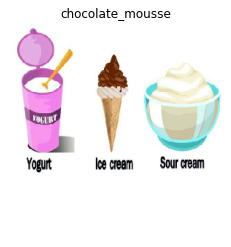

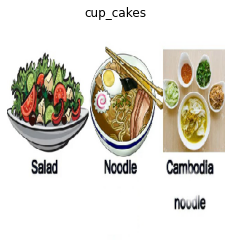

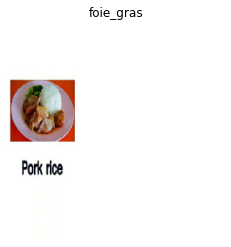

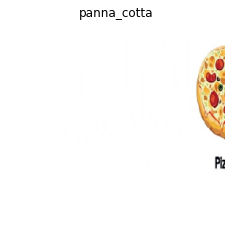

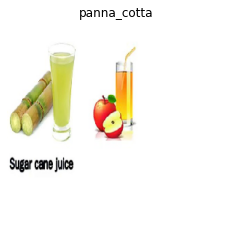

...

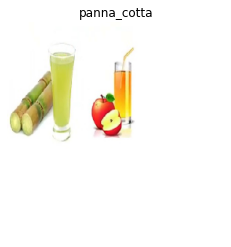

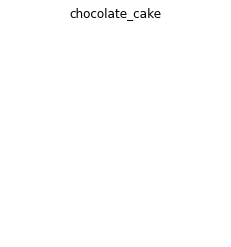

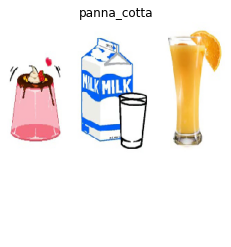

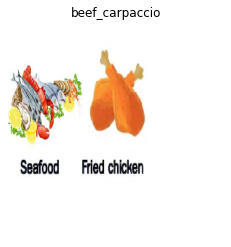

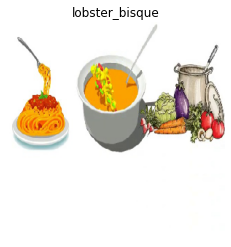

In [ ]:
from tqdm import tqdm
from glob import glob
import math


input_video = "Types of foods in English  List Names of Foods  Food Vocabulary.mp4"
test_videos = []
test_videos.append(input_video)
test_videos = np.array(test_videos)

predict = []
# actual = []

# for loop to extract frames from each test video
for i in tqdm(range(test_videos.shape[0])):
    count = 0
    videoFile = test_videos[i]
    cap = cv2.VideoCapture(test_videos[i])   # capturing the video from the given path
    frameRate = cap.get(5) #frame rate
    x=1
    # removing all other files from the temp folder
    # files = glob('temp/*')
    # for f in files:
    #     os.remove(f)
    while(cap.isOpened()):
        frameId = cap.get(1) #current frame number
        ret, frame = cap.read()
        if (ret != True):
            break
        if (frameId % math.floor(frameRate) == 0):
            # storing the frames of this particular video in temp folder
            filename ='temp/' + "_frame%d.jpg" % count;count+=1
            cv2.imwrite(filename, frame)
    cap.release()
    
    # reading all the frames from temp folder
    images = glob("temp/*.jpg")
    
    # prediction_images = []
    # for i in range(len(images)):
    #     img = image.load_img(images[i], target_size=(299,299,3))
    #     img = image.img_to_array(img)
    #     img = img/255
    #     prediction_images.append(img)
        
    # # converting all the frames for a test video into numpy array
    # prediction_images = np.array(prediction_images)
    # # extracting features using pre-trained model
    # prediction_images = model_best.predict(prediction_images)
    # # converting features in one dimensional array
    # prediction_images = prediction_images.reshape(prediction_images.shape[0], 101)
    # predicting tags for each array
    prediction = predict_class(model_best, images)
    # appending the mode of predictions in predict list to assign the tag to the video
    predict.append(y.columns.values[s.mode(prediction)[0][0]])
    # appending the actual tag of the video
    # actual.append(videoFile.split('/')[1].split('_')[1])